### Clustering Real Estate

In [1]:
#Import the Libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pyspark
import pyspark.pandas as ps

In [2]:
#Initialize the spark session
from pyspark.sql import SparkSession
spark = SparkSession.builder.appName('ML Pyspark').getOrCreate()
spark

In [3]:
# Read the data
df = spark.read.csv('Dataset Real Estate.csv',header=True,inferSchema=True)

In [4]:
df.printSchema()

root
 |-- _c0: integer (nullable = true)
 |-- Address: string (nullable = true)
 |-- Beds: string (nullable = true)
 |-- Baths: string (nullable = true)
 |-- Area: string (nullable = true)
 |-- Price: integer (nullable = true)
 |-- Street: string (nullable = true)
 |-- District: string (nullable = true)
 |-- City: string (nullable = true)
 |-- Zip Code: string (nullable = true)



In [5]:
df.show()

+---+--------------------+------+-----+--------------------+-------+--------------------+--------------------+----+--------+
|_c0|             Address|  Beds|Baths|                Area|  Price|              Street|            District|City|Zip Code|
+---+--------------------+------+-----+--------------------+-------+--------------------+--------------------+----+--------+
|  0|4-74 48th Ave  #9...|     1|    1|                 700| 555000|  4-74 48th Ave  #9K|    Long Island City|  NY|   11109|
|  1|469 E  49th St   ...|    10|    6|                 n/a|1250000| 469 E  49th St   #6|            Brooklyn|  NY|   11203|
|  2|715 Avenue L, Bro...|     8|    6|               2,015|1690000|        715 Avenue L|            Brooklyn|  NY|   11230|
|  3|223 E  62nd St, N...|     5|    6|               3,750|7995000|      223 E  62nd St|            New York|  NY|   10065|
|  4|1824 E  17th St  ...|     2|    2|                 888| 579000|1824 E  17th St  ...|            Brooklyn|  NY|   11229|


### Cleaning the Data

In [6]:
from pyspark.sql.functions import *
df = df.withColumn('Area', regexp_replace('Area', ',', ''))
df = df.withColumn('Area', split(df.Area, " ").getItem(0))
df = df.withColumn('Beds', regexp_replace('Beds', 'Studio', '0'))

In [7]:
print((df.count(), len(df.columns)))

(208150, 10)


In [8]:
df.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df.columns]).show()

+---+-------+----+-----+----+-----+------+--------+----+--------+
|_c0|Address|Beds|Baths|Area|Price|Street|District|City|Zip Code|
+---+-------+----+-----+----+-----+------+--------+----+--------+
|  0|      0|   0|    0|   0|  469|     0|       0|   0|       0|
+---+-------+----+-----+----+-----+------+--------+----+--------+



In [9]:
df_clean=df.dropna()
df_clean=df_clean.where(df.Area != r'n/a')
df_clean=df_clean.where(df.Baths != r'n/')
df_clean=df_clean.dropDuplicates()
df_clean.show()

+----+--------------------+----+-----+-----+--------+--------------------+--------------+----+--------+
| _c0|             Address|Beds|Baths| Area|   Price|              Street|      District|City|Zip Code|
+----+--------------------+----+-----+-----+--------+--------------------+--------------+----+--------+
|  58|137 W  12th St #5...|   1|    1|52200|  675000| 137 W  12th St #5-1|      New York|  NY|   10011|
|  80|750 Park Ave #4-B...|   1|    2|  800| 1900000|   750 Park Ave #4-B|      New York|  NY|   10021|
| 198|33 Bionia Ave, St...|   3|    1| 1932|  849999|       33 Bionia Ave| Staten Island|  NY|   10305|
| 832|420 Jansen St, St...|   4|    5| 6800| 2500000|       420 Jansen St| Staten Island|  NY|   10312|
| 943|712 Saint Anns Av...|   3|    2| 1152|  550000|712 Saint Anns Av...|         Bronx|  NY|   10455|
| 955|214 Adams Ave, St...|   3|    1| 1280|  599000|       214 Adams Ave| Staten Island|  NY|   10306|
|1296|62-98 Woodheaven ...|   1|    1|  760|  599000|62-98 Woodh

In [10]:
print((df_clean.count(), len(df_clean.columns)))

(167712, 10)


In [11]:
from pyspark.sql.types import StringType, DateType, FloatType, IntegerType
  
df_clean = df_clean \
    .withColumn("Beds", df_clean["Beds"].cast(IntegerType()))   \
    .withColumn("Baths", df_clean["Baths"].cast(IntegerType()))   \
    .withColumn("Area" , df_clean["Area"].cast(IntegerType()))   \
    .withColumn("Price", df_clean["Price"].cast(IntegerType()))

df_clean.printSchema()

root
 |-- _c0: integer (nullable = true)
 |-- Address: string (nullable = true)
 |-- Beds: integer (nullable = true)
 |-- Baths: integer (nullable = true)
 |-- Area: integer (nullable = true)
 |-- Price: integer (nullable = true)
 |-- Street: string (nullable = true)
 |-- District: string (nullable = true)
 |-- City: string (nullable = true)
 |-- Zip Code: string (nullable = true)



In [12]:
df_clean.select(
    percentile_approx("Price", [0.25, 0.5, 0.75], 1000000).alias("quantiles")).collect()

[Row(quantiles=[439990, 710000, 1249000])]

In [13]:
q1_beds = df_clean.select(percentile_approx("Beds", [0.25], 1000000).alias("quantiles")).collect()[0]['quantiles'][0]
q3_beds = df_clean.select(percentile_approx("Beds", [0.75], 1000000).alias("quantiles")).collect()[0]['quantiles'][0]
iqr_beds = q3_beds - q1_beds

#Check the Outlier Beds
top_outlier_beds = q3_beds + 1.5 * iqr_beds
bottom_outlier_beds= q1_beds - 1.5 * iqr_beds
print(top_outlier_beds, bottom_outlier_beds)

7.0 -1.0


In [14]:
q1_baths = df_clean.select(percentile_approx("Baths", [0.25], 1000000).alias("quantiles")).collect()[0]['quantiles'][0]
q3_baths = df_clean.select(percentile_approx("Baths", [0.75], 1000000).alias("quantiles")).collect()[0]['quantiles'][0]
iqr_baths = q3_baths - q1_baths

#Check the Outlier Baths
top_outlier_baths = q3_baths + 1.5 * iqr_baths
bottom_outlier_baths = q1_baths - 1.5 * iqr_baths
print(top_outlier_baths, bottom_outlier_baths)


4.5 0.5


In [15]:
q1_area = df_clean.select(percentile_approx("Area", [0.25], 1000000).alias("quantiles")).collect()[0]['quantiles'][0]
q3_area = df_clean.select(percentile_approx("Area", [0.75], 1000000).alias("quantiles")).collect()[0]['quantiles'][0]
iqr_area = q3_area - q1_area

#Check the Outlier Area
top_outlier_area = q3_area + 1.5 * iqr_area
bottom_outlier_area = q1_area - 1.5 * iqr_area
print(top_outlier_area, bottom_outlier_area)

4167.0 -705.0


In [16]:
q1_price = df_clean.select(percentile_approx("Price", [0.25], 1000000).alias("quantiles")).collect()[0]['quantiles'][0]
q3_price = df_clean.select(percentile_approx("Price", [0.75], 1000000).alias("quantiles")).collect()[0]['quantiles'][0]
iqr_price = q3_price - q1_price

#Check the Outlier Price
top_outlier_price = q3_price + 1.5 * iqr_price
bottom_outlier_price = q1_price - 1.5 * iqr_price
print(top_outlier_price, bottom_outlier_price)

2462515.0 -773525.0


In [17]:
df_clean = df_clean.filter(df_clean['Beds']<=top_outlier_beds)
df_clean = df_clean.filter(df_clean['Baths']<=top_outlier_baths)
df_clean = df_clean.filter(df_clean['Area']<=top_outlier_area)
df_clean = df_clean.filter(df_clean['Price']<=top_outlier_price)



In [18]:
df_clean.show()

+----+--------------------+----+-----+----+-------+--------------------+-----------------+----+--------+
| _c0|             Address|Beds|Baths|Area|  Price|              Street|         District|City|Zip Code|
+----+--------------------+----+-----+----+-------+--------------------+-----------------+----+--------+
|  80|750 Park Ave #4-B...|   1|    2| 800|1900000|   750 Park Ave #4-B|         New York|  NY|   10021|
| 198|33 Bionia Ave, St...|   3|    1|1932| 849999|       33 Bionia Ave|    Staten Island|  NY|   10305|
| 943|712 Saint Anns Av...|   3|    2|1152| 550000|712 Saint Anns Av...|            Bronx|  NY|   10455|
| 955|214 Adams Ave, St...|   3|    1|1280| 599000|       214 Adams Ave|    Staten Island|  NY|   10306|
|1296|62-98 Woodheaven ...|   1|    1| 760| 599000|62-98 Woodheaven ...|        Rego Park|  NY|   11374|
|1444|1824 E  17th St  ...|   2|    2| 888| 579000|1824 E  17th St  ...|         Brooklyn|  NY|   11229|
|1520|179 E 31st Street...|   6|    3|2046|1349000|   1

In [19]:
df_selected = df_clean.select("Beds", "Baths", "Area", "Price", "District", "City", "Zip code")
df_selected.printSchema()

root
 |-- Beds: integer (nullable = true)
 |-- Baths: integer (nullable = true)
 |-- Area: integer (nullable = true)
 |-- Price: integer (nullable = true)
 |-- District: string (nullable = true)
 |-- City: string (nullable = true)
 |-- Zip code: string (nullable = true)



### Convert the Categorical Variables

In [20]:
from pyspark.ml.feature import StringIndexer

indexer = StringIndexer(inputCols=["City"], 
                        outputCols=["cityIndex"], 
                        stringOrderType="alphabetAsc")
indexed = indexer.fit(df_selected).transform(df_selected)
indexed.show()

+----+-----+----+-------+-----------------+----+--------+---------+
|Beds|Baths|Area|  Price|         District|City|Zip code|cityIndex|
+----+-----+----+-------+-----------------+----+--------+---------+
|   1|    2| 800|1900000|         New York|  NY|   10021|      6.0|
|   3|    1|1932| 849999|    Staten Island|  NY|   10305|      6.0|
|   3|    2|1152| 550000|            Bronx|  NY|   10455|      6.0|
|   3|    1|1280| 599000|    Staten Island|  NY|   10306|      6.0|
|   1|    1| 760| 599000|        Rego Park|  NY|   11374|      6.0|
|   2|    2| 888| 579000|         Brooklyn|  NY|   11229|      6.0|
|   6|    3|2046|1349000|         Brooklyn|  NY|   11226|      6.0|
|   2|    1|1075| 349900|          Bayside|  NY|   11360|      6.0|
|   0|    2|2450|1599000|         Brooklyn|  NY|   11220|      6.0|
|   4|    2|1750| 659999|    Staten Island|  NY|   10304|      6.0|
|   1|    1| 820| 278000|         Brooklyn|  NY|   11235|      6.0|
|   3|    2|1440| 739000|    Staten Island|  NY|

In [21]:
from pyspark.ml.feature import OneHotEncoder

encoder = OneHotEncoder(inputCols=["cityIndex"],
                        outputCols=["categoryCity"])
model = encoder.fit(indexed)
encoded = model.transform(indexed)
encoded.show()

+----+-----+----+-------+-----------------+----+--------+---------+------------+
|Beds|Baths|Area|  Price|         District|City|Zip code|cityIndex|categoryCity|
+----+-----+----+-------+-----------------+----+--------+---------+------------+
|   1|    2| 800|1900000|         New York|  NY|   10021|      6.0|   (6,[],[])|
|   3|    1|1932| 849999|    Staten Island|  NY|   10305|      6.0|   (6,[],[])|
|   3|    2|1152| 550000|            Bronx|  NY|   10455|      6.0|   (6,[],[])|
|   3|    1|1280| 599000|    Staten Island|  NY|   10306|      6.0|   (6,[],[])|
|   1|    1| 760| 599000|        Rego Park|  NY|   11374|      6.0|   (6,[],[])|
|   2|    2| 888| 579000|         Brooklyn|  NY|   11229|      6.0|   (6,[],[])|
|   6|    3|2046|1349000|         Brooklyn|  NY|   11226|      6.0|   (6,[],[])|
|   2|    1|1075| 349900|          Bayside|  NY|   11360|      6.0|   (6,[],[])|
|   0|    2|2450|1599000|         Brooklyn|  NY|   11220|      6.0|   (6,[],[])|
|   4|    2|1750| 659999|   

In [22]:
encoded.columns

['Beds',
 'Baths',
 'Area',
 'Price',
 'District',
 'City',
 'Zip code',
 'cityIndex',
 'categoryCity']

In [37]:
from pyspark.ml import Pipeline
from pyspark.ml.feature import MinMaxScaler
from pyspark.ml.feature import VectorAssembler

columns_to_scale = ["Area", "Price"]
assemblers = [VectorAssembler(inputCols=[col], outputCol=col + "_vec") for col in columns_to_scale]
scalers = [MinMaxScaler(inputCol=col + "_vec", outputCol=col + "_scaled") for col in columns_to_scale]
pipeline = Pipeline(stages=assemblers + scalers)
scalerModel = pipeline.fit(encoded)
scaledData = scalerModel.transform(encoded)
scaledData.show()

Exception ignored in: <function JavaWrapper.__del__ at 0x000002A8E7E844C8>
Traceback (most recent call last):
  File "C:\Users\kana\Anaconda3\envs\tensorflow_env\lib\site-packages\pyspark\ml\wrapper.py", line 53, in __del__
    if SparkContext._active_spark_context and self._java_obj is not None:
AttributeError: 'VectorAssembler' object has no attribute '_java_obj'


+----+-----+----+-------+-----------------+----+--------+---------+------------+--------+-----------+--------------------+--------------------+
|Beds|Baths|Area|  Price|         District|City|Zip code|cityIndex|categoryCity|Area_vec|  Price_vec|         Area_scaled|        Price_scaled|
+----+-----+----+-------+-----------------+----+--------+---------+------------+--------+-----------+--------------------+--------------------+
|   1|    2| 800|1900000|         New York|  NY|   10021|      6.0|   (6,[],[])| [800.0]|[1900000.0]|[0.1925211097708082]|[0.7734481196193929]|
|   3|    1|1932| 849999|    Staten Island|  NY|   10305|      6.0|   (6,[],[])|[1932.0]| [849999.0]|[0.46562123039806...|[0.3409395724348149]|
|   3|    2|1152| 550000|            Bronx|  NY|   10455|      6.0|   (6,[],[])|[1152.0]| [550000.0]|[0.27744270205066...| [0.217366231412448]|
|   3|    1|1280| 599000|    Staten Island|  NY|   10306|      6.0|   (6,[],[])|[1280.0]| [599000.0]|[0.3083232810615199]|[0.23754994439

### Make the Features into a Vector

In [38]:

featureassembler=VectorAssembler(inputCols=['Beds', 'Baths', 'Area_scaled', 'Price_scaled', 'categoryCity'],
                                 outputCol="Independent Features")
feature_output=featureassembler.transform(scaledData)

In [39]:
feature_output.show()

+----+-----+----+-------+-----------------+----+--------+---------+------------+--------+-----------+--------------------+--------------------+--------------------+
|Beds|Baths|Area|  Price|         District|City|Zip code|cityIndex|categoryCity|Area_vec|  Price_vec|         Area_scaled|        Price_scaled|Independent Features|
+----+-----+----+-------+-----------------+----+--------+---------+------------+--------+-----------+--------------------+--------------------+--------------------+
|   1|    2| 800|1900000|         New York|  NY|   10021|      6.0|   (6,[],[])| [800.0]|[1900000.0]|[0.1925211097708082]|[0.7734481196193929]|(10,[0,1,2,3],[1....|
|   3|    1|1932| 849999|    Staten Island|  NY|   10305|      6.0|   (6,[],[])|[1932.0]| [849999.0]|[0.46562123039806...|[0.3409395724348149]|(10,[0,1,2,3],[3....|
|   3|    2|1152| 550000|            Bronx|  NY|   10455|      6.0|   (6,[],[])|[1152.0]| [550000.0]|[0.27744270205066...| [0.217366231412448]|(10,[0,1,2,3],[3....|
|   3|    

### Make the CLustering Model

In [40]:
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
silhouette_score=[]
evaluator = ClusteringEvaluator(predictionCol='prediction', featuresCol='Independent Features', \
                                metricName='silhouette', distanceMeasure='squaredEuclidean')
for i in range(2,10):
    
    KMeans_algo=KMeans(featuresCol='Independent Features', k=i)
    
    KMeans_fit=KMeans_algo.fit(feature_output)
    
    output=KMeans_fit.transform(feature_output)
    
    
    
    score=evaluator.evaluate(output)
    
    silhouette_score.append(score)
    print("Number of Cluster:", i)
    print("Silhouette Score:",score)

Number of Cluster: 2
Silhouette Score: 0.5287009187271392
Number of Cluster: 3
Silhouette Score: 0.46018401874558057
Number of Cluster: 4
Silhouette Score: 0.4041063882342554
Number of Cluster: 5
Silhouette Score: 0.3909197484419036
Number of Cluster: 6
Silhouette Score: 0.3536163416641423
Number of Cluster: 7
Silhouette Score: 0.40687590606039115
Number of Cluster: 8
Silhouette Score: 0.36673835735594607
Number of Cluster: 9
Silhouette Score: 0.3968841830259025


Text(0, 0.5, 'cost')

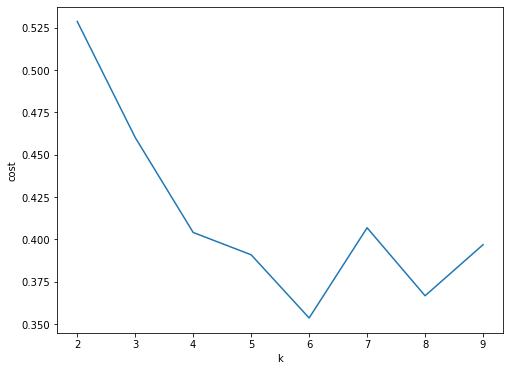

In [41]:
#Visualizing the silhouette scores in a plot
import matplotlib.pyplot as plt
fig, ax = plt.subplots(1,1, figsize =(8,6))
ax.plot(range(2,10),silhouette_score)
ax.set_xlabel('k')
ax.set_ylabel('cost')

In [43]:
KMeans_algo=KMeans(featuresCol='Independent Features', k=4)

KMeans_fit=KMeans_algo.fit(feature_output)

output=KMeans_fit.transform(feature_output)



score=evaluator.evaluate(output)

silhouette_score.append(score)
print("Number of Cluster:", 4)
print("Silhouette Score:",score)
output.show()

Number of Cluster: 4
Silhouette Score: 0.4041063882342554
+----+-----+----+-------+-----------------+----+--------+---------+------------+--------+-----------+--------------------+--------------------+--------------------+----------+
|Beds|Baths|Area|  Price|         District|City|Zip code|cityIndex|categoryCity|Area_vec|  Price_vec|         Area_scaled|        Price_scaled|Independent Features|prediction|
+----+-----+----+-------+-----------------+----+--------+---------+------------+--------+-----------+--------------------+--------------------+--------------------+----------+
|   1|    2| 800|1900000|         New York|  NY|   10021|      6.0|   (6,[],[])| [800.0]|[1900000.0]|[0.1925211097708082]|[0.7734481196193929]|(10,[0,1,2,3],[1....|         2|
|   3|    1|1932| 849999|    Staten Island|  NY|   10305|      6.0|   (6,[],[])|[1932.0]| [849999.0]|[0.46562123039806...|[0.3409395724348149]|(10,[0,1,2,3],[3....|         3|
|   3|    2|1152| 550000|            Bronx|  NY|   10455|     

In [44]:
pdf = output.toPandas()
pdf.head()

,Beds,Baths,Area,Price,District,City,Zip code,cityIndex,categoryCity,Area_vec,Price_vec,Area_scaled,Price_scaled,Independent Features,prediction
0,1,2,800,1900000,New York,NY,10021,6.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0)",[800.0],[1900000.0],[0.1925211097708082],[0.7734481196193929],"(1.0, 2.0, 0.1925211097708082, 0.7734481196193...",2
1,3,1,1932,849999,Staten Island,NY,10305,6.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0)",[1932.0],[849999.0],[0.46562123039806996],[0.3409395724348149],"(3.0, 1.0, 0.46562123039806996, 0.340939572434...",3
2,3,2,1152,550000,Bronx,NY,10455,6.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0)",[1152.0],[550000.0],[0.27744270205066346],[0.217366231412448],"(3.0, 2.0, 0.27744270205066346, 0.217366231412...",3
3,3,1,1280,599000,Staten Island,NY,10306,6.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0)",[1280.0],[599000.0],[0.3083232810615199],[0.23754994439181118],"(3.0, 1.0, 0.3083232810615199, 0.2375499443918...",3
4,1,1,760,599000,Rego Park,NY,11374,6.0,"(0.0, 0.0, 0.0, 0.0, 0.0, 0.0)",[760.0],[599000.0],[0.18287092882991557],[0.23754994439181118],"(1.0, 1.0, 0.18287092882991557, 0.237549944391...",2


In [47]:
import plotly.express as px
fig = px.scatter_3d(pdf, x='Beds', y='Price', z='Area',
                    color='prediction', symbol='City', opacity=0.7)
fig.show()

In [80]:
output = output.withColumnRenamed("prediction","label")
output.printSchema()

root
 |-- Beds: integer (nullable = true)
 |-- Baths: integer (nullable = true)
 |-- Area: integer (nullable = true)
 |-- Price: integer (nullable = true)
 |-- District: string (nullable = true)
 |-- City: string (nullable = true)
 |-- Zip code: string (nullable = true)
 |-- cityIndex: double (nullable = false)
 |-- categoryCity: vector (nullable = true)
 |-- Area_vec: vector (nullable = true)
 |-- Price_vec: vector (nullable = true)
 |-- Area_scaled: vector (nullable = true)
 |-- Price_scaled: vector (nullable = true)
 |-- Independent Features: vector (nullable = true)
 |-- label: integer (nullable = false)



In [81]:
# # ##train test split
# train_data,test_data=output.randomSplit([0.8,0.2])

### Decision Tree Classifier

In [82]:
# from pyspark.ml.classification import DecisionTreeClassifier

# dtc  = DecisionTreeClassifier(featuresCol='Independent Features', labelCol='label')
# dtc_model = dtc.fit(train_data)

In [83]:
# train_data.printSchema()

root
 |-- Beds: integer (nullable = true)
 |-- Baths: integer (nullable = true)
 |-- Area: integer (nullable = true)
 |-- Price: integer (nullable = true)
 |-- District: string (nullable = true)
 |-- City: string (nullable = true)
 |-- Zip code: string (nullable = true)
 |-- cityIndex: double (nullable = false)
 |-- categoryCity: vector (nullable = true)
 |-- Area_vec: vector (nullable = true)
 |-- Price_vec: vector (nullable = true)
 |-- Area_scaled: vector (nullable = true)
 |-- Price_scaled: vector (nullable = true)
 |-- Independent Features: vector (nullable = true)
 |-- label: integer (nullable = false)



In [87]:
# from pyspark.ml.evaluation import MulticlassClassificationEvaluator
# dt_predictions = dtc_model.transform(test_data)
# dt_evaluator  = MulticlassClassificationEvaluator(labelCol="label", predictionCol="prediction", metricName="f1")
# metrics = dt_evaluator.evaluate(dt_predictions)
# print("Accuracy on test data = %g" % metrics)

Accuracy on test data = 1


In [73]:
# test_data.select('Independent Features')

DataFrame[Independent Features: vector]

### Random Forest Model

In [32]:
# from pyspark.ml.regression import RandomForestRegressor

# rf=RandomForestRegressor(featuresCol='Independent Features', labelCol='Price')
# rf_model=rf.fit(train_data)

In [33]:
# ### Prediction of random forest model
# from pyspark.ml.evaluation import RegressionEvaluator
# rf_predictions = rf_model.transform(test_data)
# rf_evaluator = RegressionEvaluator(labelCol="Price", predictionCol="prediction", metricName="rmse")
# rmse = rf_evaluator.evaluate(rf_predictions)
# print("Root Mean Squared Error (RMSE) on test data = %g" % rmse)

In [34]:
# rf_predictions.show()

In [35]:
# rf_model.featureImportances

In [36]:
# finalized_data.select('Independent Features').take(2)

feature_columns = ['Baths', 'Area', 'Beds', 'District', 'City', 'Zip']

### Gradient Boosting Tree Model

In [37]:
# from pyspark.ml.regression import GBTRegressor
# train_data,test_data=finalized_data.randomSplit([0.8,0.2])
# gbt=GBTRegressor(featuresCol='Independent Features', labelCol='Price')
# gbt_model=gbt.fit(train_data)

In [38]:
# ### Prediction of GBT Model
# gbt_predictions = gbt_model.transform(test_data)
# gbt_evaluator = RegressionEvaluator(labelCol="Price", predictionCol="prediction", metricName="rmse")
# rmse = gbt_evaluator.evaluate(gbt_predictions)
# print("Root Mean Squared Error (RMSE) on test data = %g" % rmse)

In [39]:
# gbt_predictions.show()